<a href="https://colab.research.google.com/github/ishdeepsgh/Projects/blob/main/COVID_19_Analysis_and_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import requests
import re
from datetime import datetime
import pandas as pd

In [2]:
                                                                    def build_country_data(country):
    res=[]
    keys=country.get('timeline').get('cases').keys()
    for key in keys:
        target_entry={}
        target_entry['Report_Date']=key
        country_name=country.get('country')
        if country.get('province')!=None:
            country_name=country_name+'_'+ country.get('province')
        target_entry[country_name + '_cases']=country.get('timeline').get('cases').get(key)
        target_entry[country_name + '_deaths']=country.get('timeline').get('deaths').get(key)
        target_entry[country_name + '_recovered']=country.get('timeline').get('recovered').get(key)
        res.append(target_entry)
    return res

In [3]:
def build_covid19_data():
    request_str = 'https://corona.lmao.ninja/v2/historical?lastdays=all'
    response = requests.get(request_str)
    json_data = response.json() if response and response.status_code == 200 else None
    
    df = None
    for country in json_data:
        res = build_country_data(country)
        if df is None:
            df = pd.DataFrame(res)
            df.index = pd.DatetimeIndex(df['Report_Date'])
            df = df.drop('Report_Date', 1)
            df = df.sort_values(by=['Report_Date'])
        else:
            df_new = pd.DataFrame(res)
            df_new.index = pd.DatetimeIndex(df_new['Report_Date'])
            df_new = df_new.drop('Report_Date', 1)
            df_new = df_new.sort_values(by=['Report_Date'])
            df = df.merge(df_new, left_index=True, right_index=True)
    
    df.to_csv('covid19_data.csv')
    
    #df_backtesting = df.iloc[:-5]
    #df_backtesting.to_csv('data/covid19_data_backtesting.csv')
    
    return df
    

In [4]:
df= build_covid19_data()
df 

,Afghanistan_cases,Afghanistan_deaths,Afghanistan_recovered,Albania_cases,Albania_deaths,Albania_recovered,Algeria_cases,Algeria_deaths,Algeria_recovered,Andorra_cases,Andorra_deaths,Andorra_recovered,Angola_cases,Angola_deaths,Angola_recovered,Antigua and Barbuda_cases,Antigua and Barbuda_deaths,Antigua and Barbuda_recovered,Argentina_cases,Argentina_deaths,Argentina_recovered,Armenia_cases,Armenia_deaths,Armenia_recovered,Australia_australian capital territory_cases,Australia_australian capital territory_deaths,Australia_australian capital territory_recovered,Australia_new south wales_cases,Australia_new south wales_deaths,Australia_new south wales_recovered,Australia_northern territory_cases,Australia_northern territory_deaths,Australia_northern territory_recovered,Australia_queensland_cases,Australia_queensland_deaths,Australia_queensland_recovered,Australia_south australia_cases,Australia_south australia_deaths,Australia_south australia_recovered,Australia_tasmania_cases,...,UK_isle of man_recovered,UK_montserrat_cases,UK_montserrat_deaths,UK_montserrat_recovered,UK_turks and caicos islands_cases,UK_turks and caicos islands_deaths,UK_turks and caicos islands_recovered,UK_cases,UK_deaths,UK_recovered,Uruguay_cases,Uruguay_deaths,Uruguay_recovered,Uzbekistan_cases,Uzbekistan_deaths,Uzbekistan_recovered,Vanuatu_cases,Vanuatu_deaths,Vanuatu_recovered,Venezuela_cases,Venezuela_deaths,Venezuela_recovered,Vietnam_cases,Vietnam_deaths,Vietnam_recovered,West Bank and Gaza_cases,West Bank and Gaza_deaths,West Bank and Gaza_recovered,Western Sahara_cases,Western Sahara_deaths,Western Sahara_recovered,Yemen_cases,Yemen_deaths,Yemen_recovered,Zambia_cases,Zambia_deaths,Zambia_recovered,Zimbabwe_cases,Zimbabwe_deaths,Zimbabwe_recovered
Report_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-26,45716,1737,36232,35600,753,17352,79110,2352,51334,6534,76,5649,14920,341,7617,141,4,130,1399431,37941,1226662,130870,2068,103055,116,3,112,4556,53,3180,52,0,46,1198,6,1178,559,4,533,230,...,338,13,1,12,746,6,700,1574562,57031,0,5117,74,4021,72409,607,69670,1,0,0,101215,884,96072,1331,35,1166,78493,680,61241,10,1,8,2137,612,1484,17553,357,16779,9623,274,8397
2020-11-27,45839,1740,36295,36245,771,17755,80168,2372,51946,6610,76,5710,15008,342,7697,141,4,130,1407277,38216,1235257,132346,2090,105149,117,3,112,4564,53,3181,52,0,46,1199,6,1180,562,4,539,230,...,338,13,1,12,748,6,705,1589301,57551,0,5303,74,4107,72513,607,69780,1,0,0,101524,888,96402,1339,35,1170,80429,689,61960,10,1,8,2148,614,1491,17569,357,16845,9714,275,8470
2020-11-28,45966,1752,36709,36790,787,18152,81212,2393,52568,6610,76,5710,15087,345,7763,141,4,130,1413375,38322,1242877,133594,2121,106479,117,3,112,4568,53,3181,52,0,46,1201,6,1181,561,4,540,230,...,338,

In [5]:
df1=df.describe()
df1

,Afghanistan_cases,Afghanistan_deaths,Afghanistan_recovered,Albania_cases,Albania_deaths,Albania_recovered,Algeria_cases,Algeria_deaths,Algeria_recovered,Andorra_cases,Andorra_deaths,Andorra_recovered,Angola_cases,Angola_deaths,Angola_recovered,Antigua and Barbuda_cases,Antigua and Barbuda_deaths,Antigua and Barbuda_recovered,Argentina_cases,Argentina_deaths,Argentina_recovered,Armenia_cases,Armenia_deaths,Armenia_recovered,Australia_australian capital territory_cases,Australia_australian capital territory_deaths,Australia_australian capital territory_recovered,Australia_new south wales_cases,Australia_new south wales_deaths,Australia_new south wales_recovered,Australia_northern territory_cases,Australia_northern territory_deaths,Australia_northern territory_recovered,Australia_queensland_cases,Australia_queensland_deaths,Australia_queensland_recovered,Australia_south australia_cases,Australia_south australia_deaths,Australia_south australia_recovered,Australia_tasmania_cases,...,UK_isle of man_recovered,UK_montserrat_cases,UK_montserrat_deaths,UK_montserrat_recovered,UK_turks and caicos islands_cases,UK_turks and caicos islands_deaths,UK_turks and caicos islands_recovered,UK_cases,UK_deaths,UK_recovered,Uruguay_cases,Uruguay_deaths,Uruguay_recovered,Uzbekistan_cases,Uzbekistan_deaths,Uzbekistan_recovered,Vanuatu_cases,Vanuatu_deaths,Vanuatu_recovered,Venezuela_cases,Venezuela_deaths,Venezuela_recovered,Vietnam_cases,Vietnam_deaths,Vietnam_recovered,West Bank and Gaza_cases,West Bank and Gaza_deaths,West Bank and Gaza_recovered,Western Sahara_cases,Western Sahara_deaths,Western Sahara_recovered,Yemen_cases,Yemen_deaths,Yemen_recovered,Zambia_cases,Zambia_deaths,Zambia_recovered,Zimbabwe_cases,Zimbabwe_deaths,Zimbabwe_recovered
count,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,3.140000e+02,314.000000,3.140000e+02,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.0,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,...,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,3.140000e+02,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.0,314.0,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000,314.000000
mean,22178.792994,746.442675,15256.321656,6965.079618,179.993631,3760.015924,24519.761146,944.503185,16688.573248,1441.742038,41.445860,1094.156051,2660.484076,80.038217,1154.210191,58.108280,2.296178,48.009554,3.222918e+05,8040.748408,2.535130e+05,31582.363057,540.910828,22826.901274,87.503185,2.283439,80.127389,2917.219745,37.082803,2093.576433,25.656051,0.0,22.426752,871.363057,4.617834,792.385350,367.210191,3.006369,334.920382,172.703822,...,226.535032,9.369427,0.703822,7.484076,239.493631,2.340764,187.840764,3.560628e+05,29955.213376,13.105096,1283.678344,27.993631,1042.019108,23404.337580,180.398089,21023.646497,0.066879,0.0,0.0,28468.426752,243.675159,24315.041401,559.859873,12.175159,454.398089,16538.003185,134.283439,12553.710191,6.882166,0.601911,5.273885,1014.108280,287.493631,569.984076,5905.761146,132.257962,5356.767516,3088.987261,85.592357,2399.257962
std,17941.886368,665.212679,14884.034990,9129.330597,212.555664,4661.742557,24363.818409,742.343450,16761.107712,1714.606456,24.517554,1383.403020,4263.337111,109.268283,2007.202846,47.514528,1.334544,45.308420,4.463936e+05,11904.406399,3.806753e+05,35496.273539,569.967062,26195.293714,43.823728,1.240651,45.482465,1555.531055,20.670691,1316.642458,13.791331,0.0,14.234101,431.811995,2.458694,470.132373,182.974920,1.716288,195.766071,92.724324,...,134.104796,4.946728,0.457299,5.08

In [6]:
df_totalcases=df.iloc[:,::3]
df_totalcases

,Afghanistan_cases,Albania_cases,Algeria_cases,Andorra_cases,Angola_cases,Antigua and Barbuda_cases,Argentina_cases,Armenia_cases,Australia_australian capital territory_cases,Australia_new south wales_cases,Australia_northern territory_cases,Australia_queensland_cases,Australia_south australia_cases,Australia_tasmania_cases,Australia_victoria_cases,Australia_western australia_cases,Austria_cases,Azerbaijan_cases,Bahamas_cases,Bahrain_cases,Bangladesh_cases,Barbados_cases,Belarus_cases,Belgium_cases,Belize_cases,Benin_cases,Bhutan_cases,Bolivia_cases,Bosnia_cases,Botswana_cases,Brazil_cases,Brunei_cases,Bulgaria_cases,Burkina Faso_cases,Burma_cases,Burundi_cases,Cabo Verde_cases,Cambodia_cases,Cameroon_cases,Canada_alberta_cases,...,Sri Lanka_cases,Sudan_cases,Suriname_cases,Sweden_cases,Switzerland_cases,Syrian Arab Republic_cases,Taiwan_cases,Tajikistan_cases,Tanzania_cases,Thailand_cases,Timor-Leste_cases,Togo_cases,Trinidad and Tobago_cases,Tunisia_cases,Turkey_cases,USA_cases,Uganda_cases,Ukraine_cases,UAE_cases,UK_anguilla_cases,UK_bermuda_cases,UK_british virgin islands_cases,UK_cayman islands_cases,UK_channel islands_cases,UK_falkland islands (malvinas)_cases,UK_gibraltar_cases,UK_isle of man_cases,UK_montserrat_cases,UK_turks and caicos islands_cases,UK_cases,Uruguay_cases,Uzbekistan_cases,Vanuatu_cases,Venezuela_cases,Vietnam_cases,West Bank and Gaza_cases,Western Sahara_cases,Yemen_cases,Zambia_cases,Zimbabwe_cases
Report_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,3,0,0,5,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,3,0,0,7,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,4,0,0,8,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-26,45716,35600,79110,6534,14920,141,1399431,130870,116,4556,52,1198,559,230,20345,817,266038,106101,7482,86347,456438,266,130012,567532,5515,2974,389,144390,84252,10258,6204220,150,136628,2777,85205,677,10570,307,24022,51878,...,22028,16864,5307,236355,313978,7542,625,12044,509,3961,30,2904,6570,92475,503738,12883264,19115,695755,163967,4,241,71,269,1147,16,991,369,13,746,1574562,5117,72409,1,101215,1331,78493,10,2137,17553,9623
2020-11-27,45839,36245,80168,6610,15008,141,1407277,132346,117,4564,52,1199,562,230,20345,817,270992,109813,7496,86515,458711,270,131633,570829,5587,2974,395,144494,85431,10258,6238350,150,139955,2816,86633,681,10626,308,24117,53105,...,22501,16864,5311,243129,318290,7635,639,12082,509,3966,30,2926,6586,93770,548244,13088821,19588,712249,165250,4,242,71,269,1218,16,999,369,13,748,1589301,5303,72513,1,101524,1339,80429,10,2148,17569,9714
2020-11-28,45966,36790,81212,6610,15087,141,1413375,133594,117,4568,52,1201,561,230,20345,818,275661,114025,7496,86645,460619,270,133324,574448,5647,2974,396,144592,86710,10258,6290272,150,141747,2816,87977,681,10700,315,24117,54836,...,22988,17404,5312,243129,318290,7715,648,12118,509,3977,30,2946,6630,94980,578347,13244417,19944,728834,166502,4,247,71,274,1218,16,1009,

In [7]:
df_few_totalcases=df_totalcases.iloc[296:310,20:35]
df_few_totalcases

,Bangladesh_cases,Barbados_cases,Belarus_cases,Belgium_cases,Belize_cases,Benin_cases,Bhutan_cases,Bolivia_cases,Bosnia_cases,Botswana_cases,Brazil_cases,Brunei_cases,Bulgaria_cases,Burkina Faso_cases,Burma_cases
Report_Date,,,,,,,,,,,,,,,
2020-11-13,428965,249,111622,525012,4715,2844,369,143069,69625,8225,5810652,148,94937,2609,66734
2020-11-14,430496,249,112870,531280,4783,2844,375,143181,70900,8225,5848959,148,97435,2635,68011
2020-11-15,432333,250,114185,535939,4861,2844,375,143246,71956,8225,5863093,148,98251,2641,68994
2020-11-16,434472,250,115448,537871,4883,2884,377,143371,72689,9103,5876464,148,101770,2652,70161
2020-11-17,436684,250,116699,540605,4920,2884,378,143473,73944,9103,5911758,148,106598,2652,71730
2020-11-18,438795,252,118008,545787,4958,2916,378,143569,75577,9103,5945849,148,110536,2670,73322
2020-11-19,441159,253,119390,550264,5018,2916,378,143756,76757,9594,5981767,148,114435,2686,74882
2020-11-20,443434,253,120847,553680,5056,2916,378,143854,77994,9594,6020164,148,118418,2686,76414
2020-11-21,445281,255,122435,556904,5110,2916,379,143922,79309,9594,6052786,148,120697,2703,77848


In [8]:
!pip install bar-chart-race &>/dev/null

In [9]:
!pip install ipython_autotime &> /dev/null

In [10]:
%load_ext autotime
import bar_chart_race as bcr
import matplotlib.pyplot as plt


time: 5.04 ms


In [11]:
bcr.bar_chart_race?

time: 58.2 ms


In [12]:
bcr.bar_chart_race(df=df_few_totalcases,n_bars=15,filter_column_colors=True,filename=None,title='Total Cases of a few countries') #Worst affected is Brazil

time: 16.9 s


In [13]:
df_deaths=df[['Brazil_deaths','Belgium_deaths','Bangladesh_deaths','Bolivia_deaths','Belarus_deaths','Bulgaria_deaths','Bosnia_deaths','Burma_deaths','Botswana_deaths','Belize_deaths','Benin_deaths','Burkina Faso_deaths','Bhutan_deaths','Barbados_deaths','Brunei_deaths'  ]]
df_deaths

,Brazil_deaths,Belgium_deaths,Bangladesh_deaths,Bolivia_deaths,Belarus_deaths,Bulgaria_deaths,Bosnia_deaths,Burma_deaths,Botswana_deaths,Belize_deaths,Benin_deaths,Burkina Faso_deaths,Bhutan_deaths,Barbados_deaths,Brunei_deaths
Report_Date,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-26,171460,16219,6524,8939,1128,3529,2480,1846,31,131,43,68,0,7,3
2020-11-27,171974,16339,6544,8943,1136,3680,2542,1865,31,141,43,68,0,7,3
2020-11-28,172561,16461,6580,8949,1143,3749,2576,1887,31,144,43,68,0,7,3


time: 66.4 ms


In [99]:
bcr.bar_chart_race(df=df_deaths,label_bars=True,title='Deaths of a few countries')

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.916666666666666 x 3.5 to 6.902777777777778 x 3.5
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 994x504 -pix_fmt rgba -r 20.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpxf1ju6_y/temp.m4v


time: 5min 50s


In [15]:
df_recovered=df[['Brazil_recovered','Belgium_recovered','Bangladesh_recovered','Bolivia_recovered','Belarus_recovered','Bulgaria_recovered','Bosnia_recovered','Burma_recovered','Botswana_recovered','Belize_recovered','Benin_recovered','Burkina Faso_recovered','Bhutan_recovered','Barbados_recovered','Brunei_recovered']]
df_recovered

,Brazil_recovered,Belgium_recovered,Bangladesh_recovered,Bolivia_recovered,Belarus_recovered,Bulgaria_recovered,Bosnia_recovered,Burma_recovered,Botswana_recovered,Belize_recovered,Benin_recovered,Burkina Faso_recovered,Bhutan_recovered,Barbados_recovered,Brunei_recovered
Report_Date,,,,,,,,,,,,,,,
2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-26,5556887,0,371453,120720,108769,44875,48780,64645,7717,3021,2579,2567,368,246,145
2020-11-27,5581436,0,373676,121050,110152,46740,50001,65972,7717,3056,2579,2579,372,249,145
2020-11-28,5581436,0,375885,121280,111455,47779,51068,67588,7717,3072,2819,2579,373,249,145


time: 36.9 ms


In [145]:
bcr.bar_chart_race(df_recovered,filter_column_colors=True,title='Recoveries in a few countries')

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 7.071180555555555 x 3.5 to 7.069444444444445 x 3.5
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1018x504 -pix_fmt rgba -r 20.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmp7r_n0a_l/temp.m4v


time: 6min 7s


In [16]:
df_india=df[['India_cases','India_deaths','India_recovered']]
df_india

,India_cases,India_deaths,India_recovered
Report_Date,,,
2020-01-22,0,0,0
2020-01-23,0,0,0
2020-01-24,0,0,0
2020-01-25,0,0,0
2020-01-26,0,0,0
...,...,...,...
2020-11-26,9309787,135715,8718517
2020-11-27,9351109,136200,8759969
2020-11-28,9392919,136696,8802267


time: 16.5 ms


In [17]:
active_cases=df_india['India_cases']-(df_india['India_recovered']+df_india['India_deaths'])
df_india['Active_cases']=active_cases
df_india

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,India_cases,India_deaths,India_recovered,Active_cases
Report_Date,,,,
2020-01-22,0,0,0,0
2020-01-23,0,0,0,0
2020-01-24,0,0,0,0
2020-01-25,0,0,0,0
2020-01-26,0,0,0,0
...,...,...,...,...
2020-11-26,9309787,135715,8718517,455555
2020-11-27,9351109,136200,8759969,454940
2020-11-28,9392919,136696,8802267,453956


time: 30.1 ms


In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

time: 658 ms


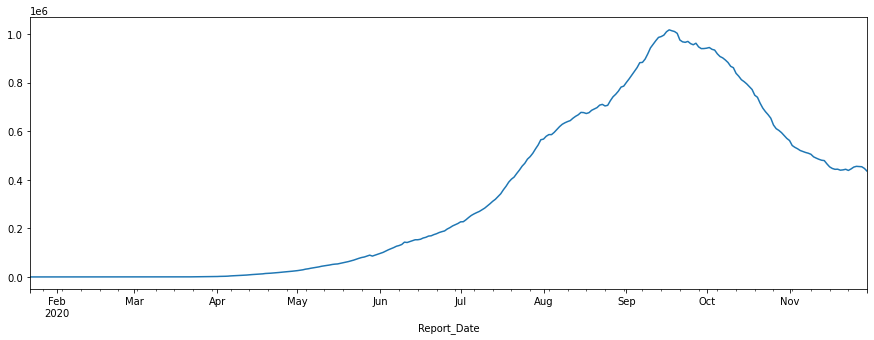

time: 362 ms


In [31]:
df_india.Active_cases.plot(figsize=(15,5))

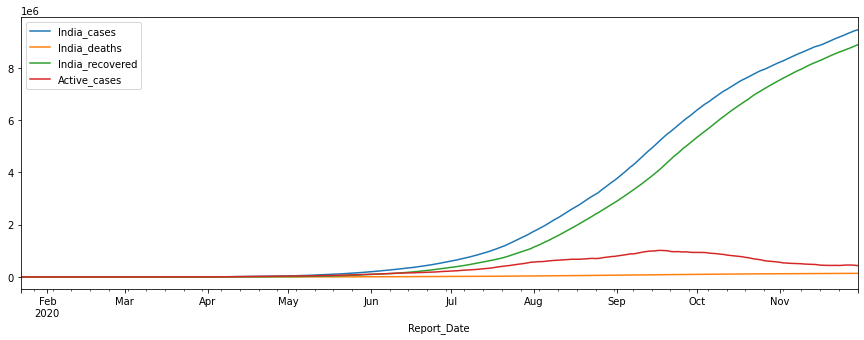

time: 371 ms


In [61]:
df_india.plot(kind='line',y=['India_cases','India_deaths','India_recovered','Active_cases'],figsize=(15,5))

In [19]:
df_india['Active_cases'].max()

1017754

time: 3.29 ms


In [54]:
bcr.bar_chart_race(df=df_india,n_bars=4,filter_column_colors=True,title='COVID 19 Situation in India')

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.696180555555555 x 3.5 to 6.694444444444445 x 3.5
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 964x504 -pix_fmt rgba -r 20.0 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpqsyvx80h/temp.m4v


time: 3min 25s


In [101]:
df_new=df_india.iloc[:,3:4]
df_new


,Active_cases
Report_Date,
2020-01-22,0
2020-01-23,0
2020-01-24,0
2020-01-25,0
2020-01-26,0
...,...
2020-11-26,455555
2020-11-27,454940
2020-11-28,453956


time: 21.4 ms


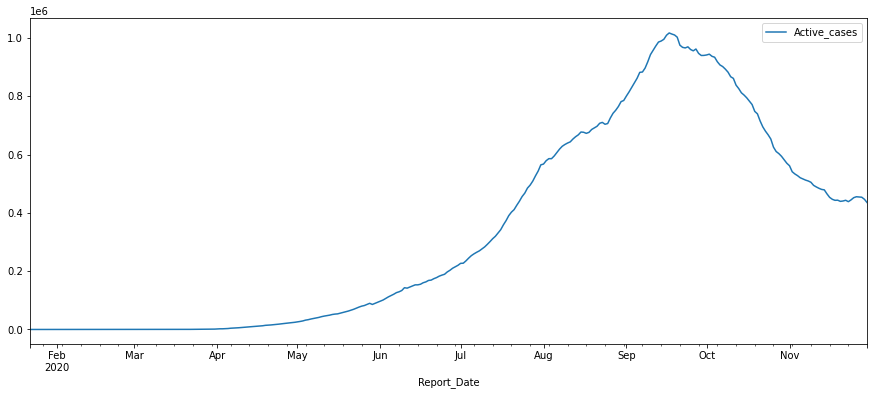

time: 312 ms


In [103]:
df_new.plot(figsize=(15,6))
plt.show()

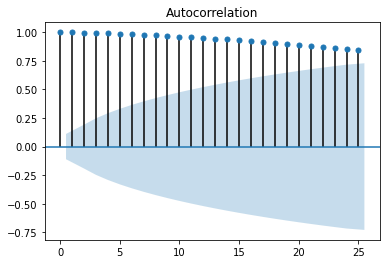

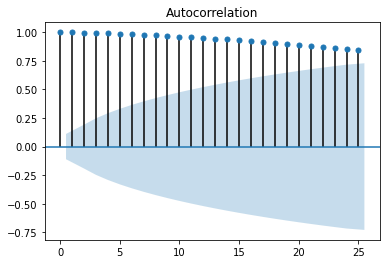

time: 349 ms


In [148]:
from statsmodels.graphics.tsaplots import plot_acf #showing the correlation between the same series with a time lag
plot_acf(df_new)

In [147]:
#Converting series into stationary for time series analysis
df_mod=df_new.diff(periods=1)
df_mod=df_mod[1:]
df_mod.head()


,Active_cases
Report_Date,
2020-01-23,0.0
2020-01-24,0.0
2020-01-25,0.0
2020-01-26,0.0
2020-01-27,0.0


time: 15.2 ms


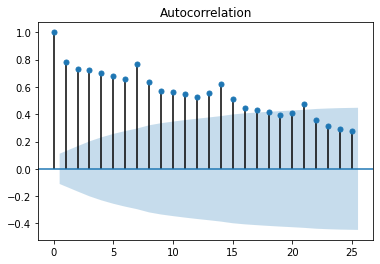

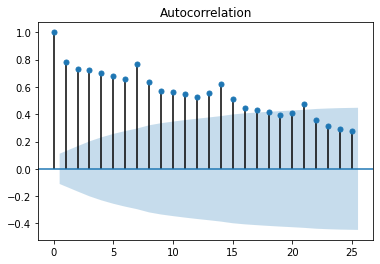

time: 328 ms


In [151]:
plot_acf(df_mod)

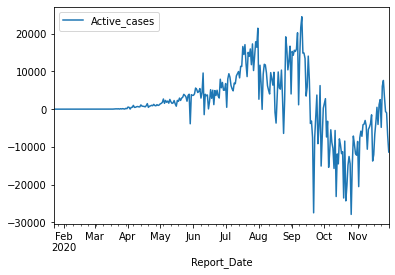

time: 345 ms


In [152]:
df_mod.plot()

In [112]:
x=df_new.values

314

time: 3.59 ms


In [114]:
train=x[0:290]
test=x[290:]
predictions=[]


time: 1.05 ms


In [117]:
#train the forecasting model using Autoregressive Model
from statsmodels.tsa.ar_model import AR
from sklearn.metrics import mean_squared_error
model_ar=AR(train)
model_ar_fit=model_ar.fit()

time: 39.3 ms


In [122]:
predictions=model_ar_fit.predict(start=290,end=314)

time: 3.67 ms


In [119]:
test

array([[512665],
       [509673],
       [505265],
       [494657],
       [489294],
       [484547],
       [480719],
       [479216],
       [465478],
       [453401],
       [446805],
       [443303],
       [443794],
       [439747],
       [440962],
       [443486],
       [438667],
       [444746],
       [452344],
       [455555],
       [454940],
       [453956],
       [446952],
       [435603]])

time: 5.67 ms


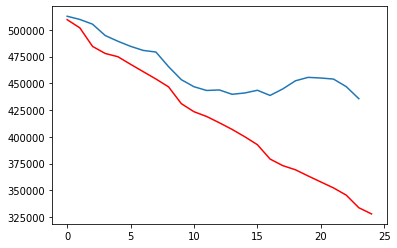

time: 180 ms


In [123]:
plt.plot(test)
plt.plot(predictions,color='red')

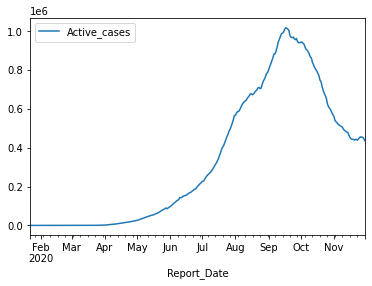

time: 315 ms


In [124]:
df_new.plot()

In [125]:
#ARIMA model
from statsmodels.tsa.arima_model import ARIMA

time: 1.28 ms


In [135]:
#p,d,q p=periods taken for autoregressive ar model,d=integrated order,q=periods in moving average model
model_arima_fit=ARIMA(train,order=(3,1,1))
model_arima_fit=model_arima.fit()
print(model_arima_fit.aic)

5684.9385256571595
time: 339 ms


In [132]:
predictions=model_arima_fit.forecast(steps=24)[0]
predictions

array([510198.29881896, 503602.17996324, 497400.58161928, 491422.44859567,
       485606.42457883, 479960.424031  , 474485.6056648 , 469176.81688563,
       464029.35730716, 459039.21587375, 454202.47754742, 449515.27503636,
       444973.83681864, 440574.4908331 , 436313.65785659, 432187.84845332,
       428193.66104892, 424327.77979413, 420586.97237852, 416968.08791803,
       413468.0549057 , 410083.87921278, 406812.64213926, 403651.49851357])

time: 7.25 ms


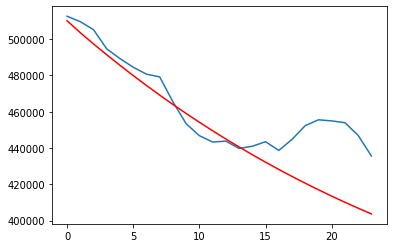

time: 160 ms


In [134]:
plt.plot(test)
plt.plot(predictions,color='red') #looks better than autoregressive ar model

In [144]:
mean_squared_error(test,predictions)

411202756.4036315

time: 3.47 ms


In [138]:
import itertools
p=d=q=range(0,5)
pdq=list(itertools.product(p,d,q))
pdq 

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (0, 0, 4),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 1, 3),
 (0, 1, 4),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (0, 2, 3),
 (0, 2, 4),
 (0, 3, 0),
 (0, 3, 1),
 (0, 3, 2),
 (0, 3, 3),
 (0, 3, 4),
 (0, 4, 0),
 (0, 4, 1),
 (0, 4, 2),
 (0, 4, 3),
 (0, 4, 4),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (1, 0, 4),
 (1, 1, 0),
 (1, 1, 1),
 (1, 1, 2),
 (1, 1, 3),
 (1, 1, 4),
 (1, 2, 0),
 (1, 2, 1),
 (1, 2, 2),
 (1, 2, 3),
 (1, 2, 4),
 (1, 3, 0),
 (1, 3, 1),
 (1, 3, 2),
 (1, 3, 3),
 (1, 3, 4),
 (1, 4, 0),
 (1, 4, 1),
 (1, 4, 2),
 (1, 4, 3),
 (1, 4, 4),
 (2, 0, 0),
 (2, 0, 1),
 (2, 0, 2),
 (2, 0, 3),
 (2, 0, 4),
 (2, 1, 0),
 (2, 1, 1),
 (2, 1, 2),
 (2, 1, 3),
 (2, 1, 4),
 (2, 2, 0),
 (2, 2, 1),
 (2, 2, 2),
 (2, 2, 3),
 (2, 2, 4),
 (2, 3, 0),
 (2, 3, 1),
 (2, 3, 2),
 (2, 3, 3),
 (2, 3, 4),
 (2, 4, 0),
 (2, 4, 1),
 (2, 4, 2),
 (2, 4, 3),
 (2, 4, 4),
 (3, 0, 0),
 (3, 0, 1),
 (3, 0, 2),
 (3, 0, 3),
 (3, 0, 4),
 (3, 1, 0),
 (3, 1, 1),
 (3, 1, 2),
 (3,

time: 8.37 ms


In [143]:
import warnings
warnings.filterwarnings('ignore')
for param in pdq:
    try:
        model_arima=ARIMA(train,order=param)
        model_arima_fit=model_arima.fit()
        print(param,model_arima_fit.aic)
    except:
            continue

(0, 0, 0) 8236.868738047368
(0, 0, 2) 7476.411656650358
(0, 0, 3) 7250.669933969328
(0, 0, 4) 7048.182392438306
(0, 1, 0) 6021.0012732371
(0, 1, 1) 5873.790544088651
(0, 1, 2) 5814.443732723571
(0, 1, 3) 5773.37333208629
(0, 1, 4) 5740.206521918169
(0, 2, 0) 5750.715088238098
(0, 2, 1) 5664.6608448269435
(0, 2, 2) 5664.609997964338
(1, 0, 1) 5912.513842398634
(1, 0, 2) 5850.083945016928
(1, 0, 3) 5808.616916503845
(1, 0, 4) 5773.486925796298
(1, 1, 0) 5740.922538189461
(1, 1, 1) 5683.574340131523
(1, 1, 2) 5683.967329650364
(1, 1, 3) 5685.033243658679
(1, 1, 4) 5681.006778889322
(1, 2, 0) 5706.138646053634
(1, 2, 1) 5664.921742188397
(1, 2, 2) 5654.344351003042
(1, 2, 3) 5656.334374925701
(1, 2, 4) 5665.925880138497
(2, 0, 1) 5710.246469906551
(2, 0, 2) 5710.253859320874
(2, 0, 3) 5711.480154118102
(2, 0, 4) 5709.224691737203
(2, 1, 0) 5712.975317991861
(2, 1, 1) 5684.259113162421
(2, 1, 2) 5673.626006252094
(2, 1, 3) 5675.5632369693685
(2, 1, 4) 5682.720150489127
(2, 2, 0) 5682.629414

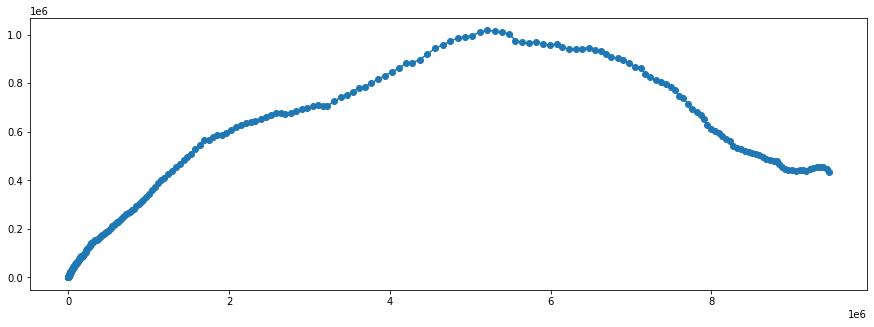

time: 206 ms


In [97]:
df_mod=df_india[['India_cases','Active_cases']]
import matplotlib.pyplot as plt
plt.figure(figsize=(15,5))
plt.plot(df_mod['India_cases'],df_mod['Active_cases'])
plt.scatter(df_mod['India_cases'],df_mod['Active_cases'])


In [98]:

import fbprophet
op = fbprophet.Prophet(changepoint_prior_scale=1)
#op.add_seasonality(name='Monthly',period=30,fourier_order=7)
op.fit(df_mod)

ValueError: ignored

time: 93.1 ms
